# Unet-Training

training of a simple UNET model, taking the images in folder X and the binary masks in folder Y

In [1]:
# import all we need to build a dataset and train a unet model using torch

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
from matplotlib import colors
import numpy as np
import os

import matplotlib.pyplot as plt
from tqdm.auto import tqdm

from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid



# 26
# train 23
# test 3


  0%|          | 0/7000 [00:00<?, ?it/s]

Epoch: 0, Iteration: 0, Loss: 0.5506297945976257


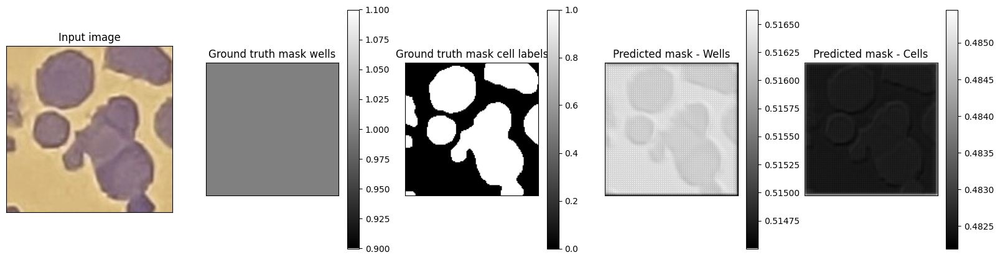

Epoch: 100, Iteration: 0, Loss: 0.21152141690254211


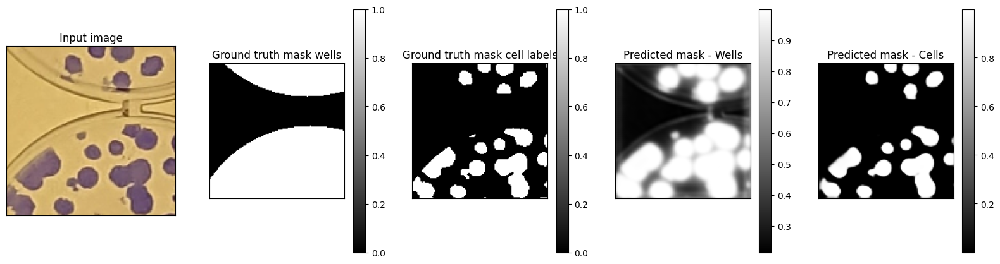

Epoch: 200, Iteration: 0, Loss: 0.27603548765182495


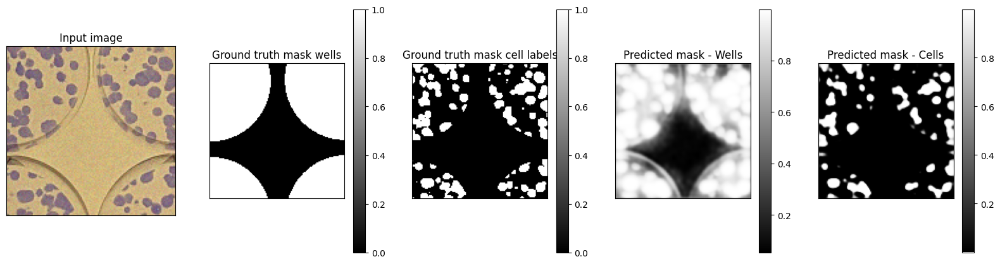

Epoch: 300, Iteration: 0, Loss: 0.1913619190454483


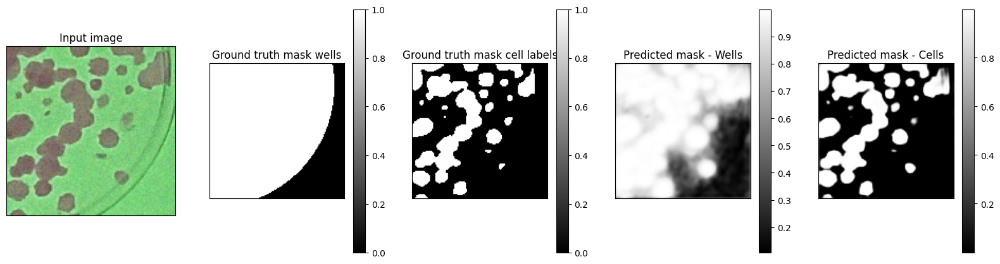

Epoch: 400, Iteration: 0, Loss: 0.12405173480510712


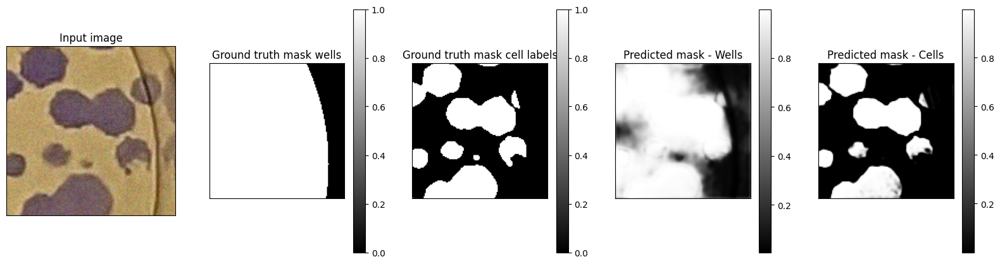

Epoch: 500, Iteration: 0, Loss: 0.16180461645126343


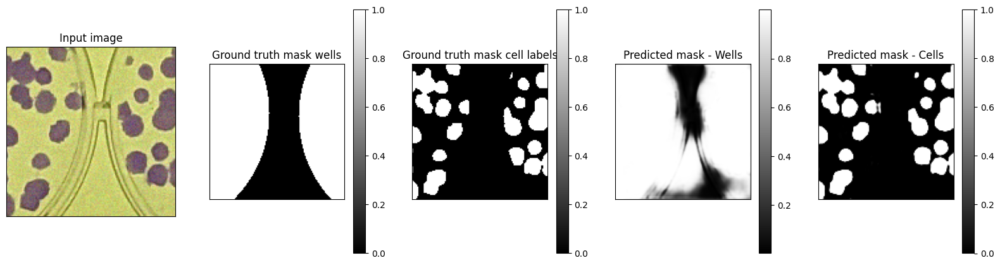

Epoch: 600, Iteration: 0, Loss: 0.10654911398887634


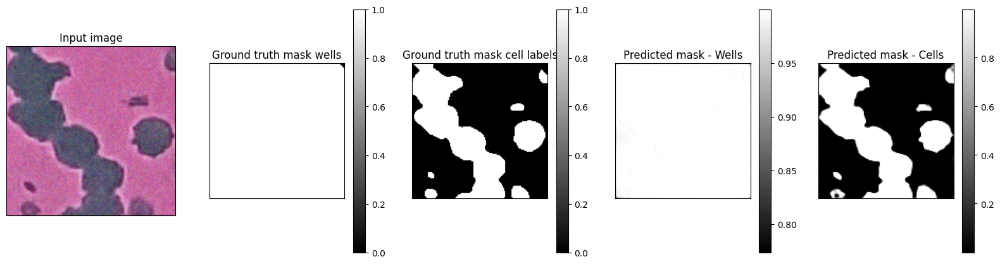

Epoch: 700, Iteration: 0, Loss: 0.13384005427360535


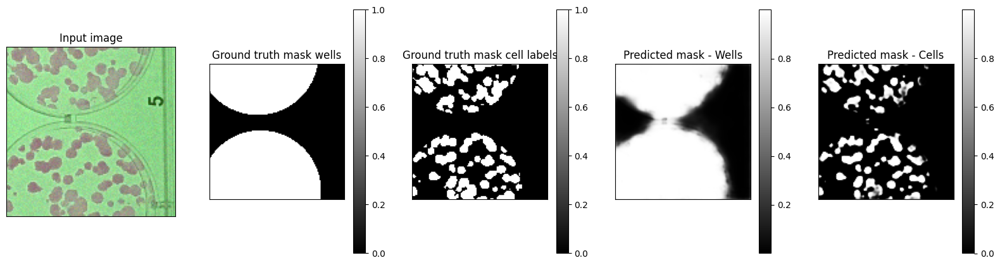

Epoch: 800, Iteration: 0, Loss: 0.18542446196079254


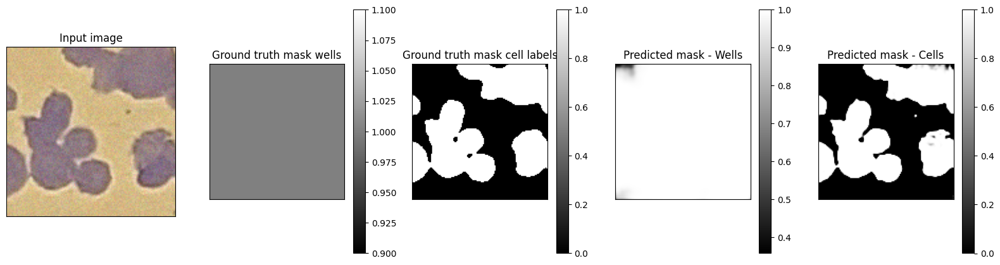

Epoch: 900, Iteration: 0, Loss: 0.14827939867973328


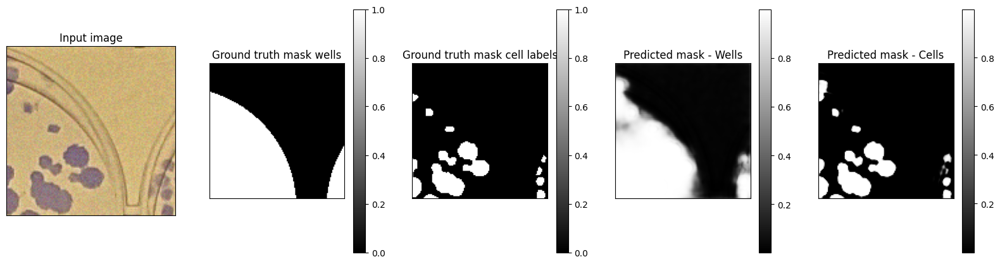

Epoch: 1000, Iteration: 0, Loss: 0.11576861143112183


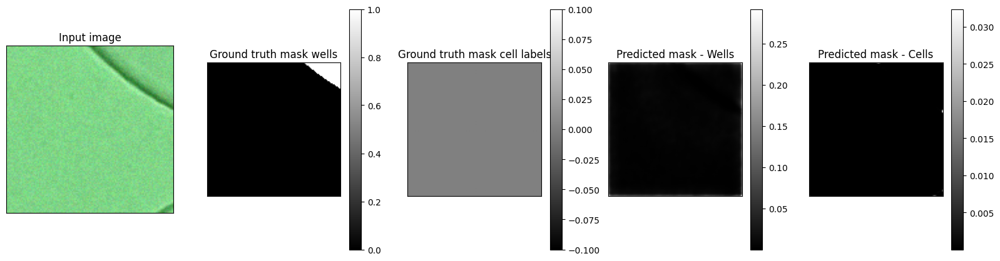

Epoch: 1100, Iteration: 0, Loss: 0.0807296484708786


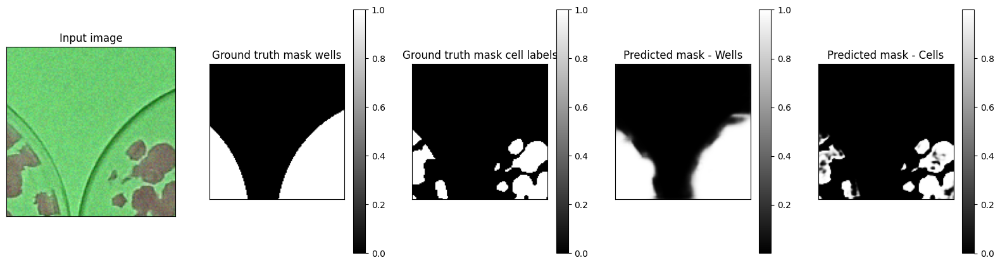

Epoch: 1200, Iteration: 0, Loss: 0.04998093098402023


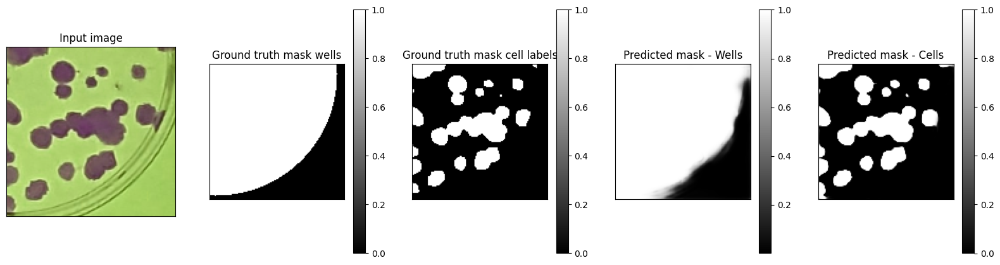

Epoch: 1300, Iteration: 0, Loss: 0.053883880376815796


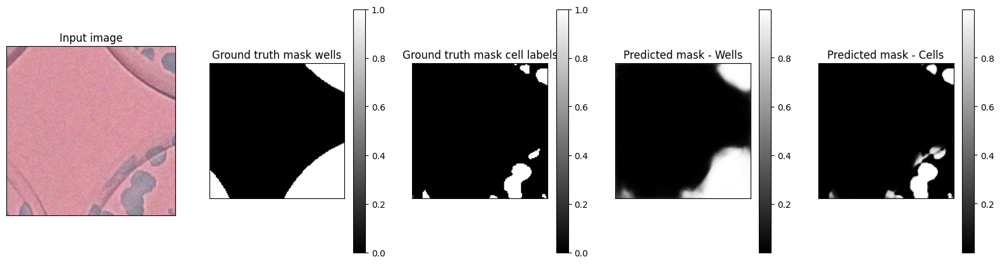

Epoch: 1400, Iteration: 0, Loss: 0.038847360759973526


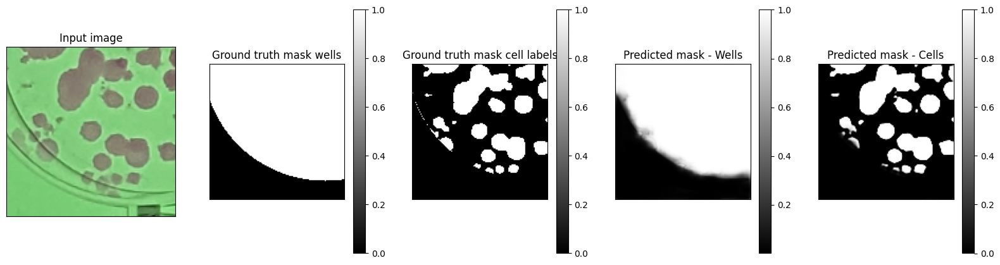

Epoch: 1500, Iteration: 0, Loss: 0.08081699162721634


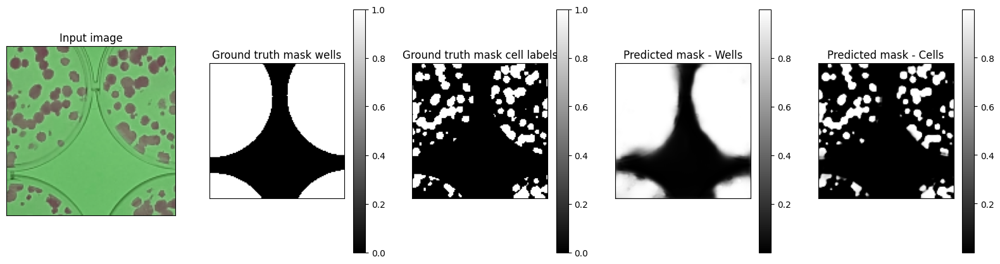

Epoch: 1600, Iteration: 0, Loss: 0.046098493039608


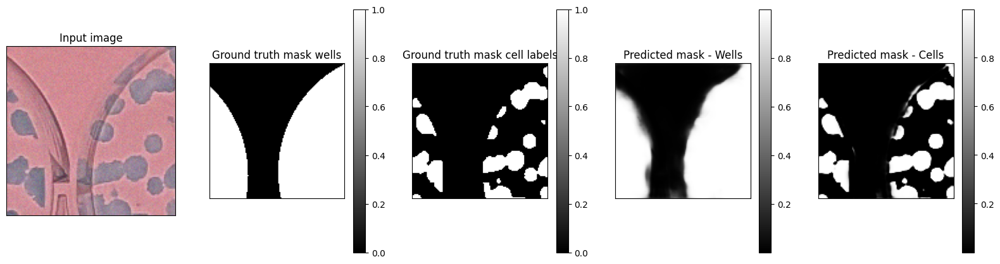

Epoch: 1700, Iteration: 0, Loss: 0.08396852016448975


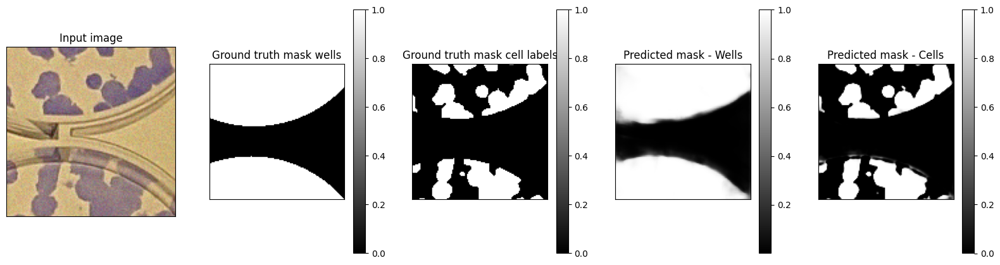

Epoch: 1800, Iteration: 0, Loss: 0.06199514865875244


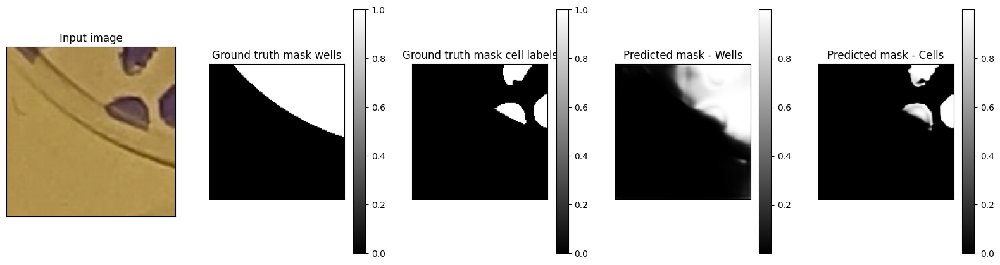

Epoch: 1900, Iteration: 0, Loss: 0.04979351535439491


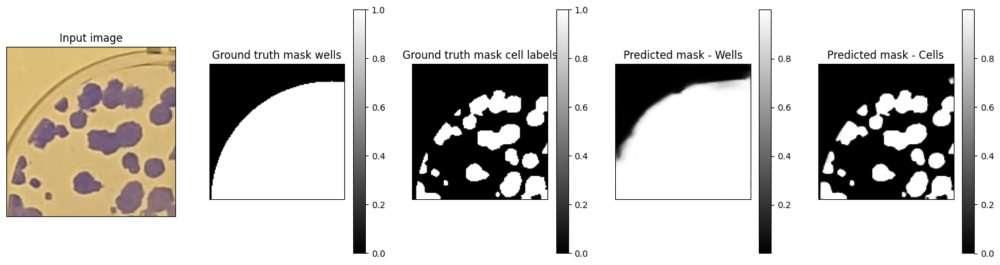

Epoch: 2000, Iteration: 0, Loss: 0.15430669486522675


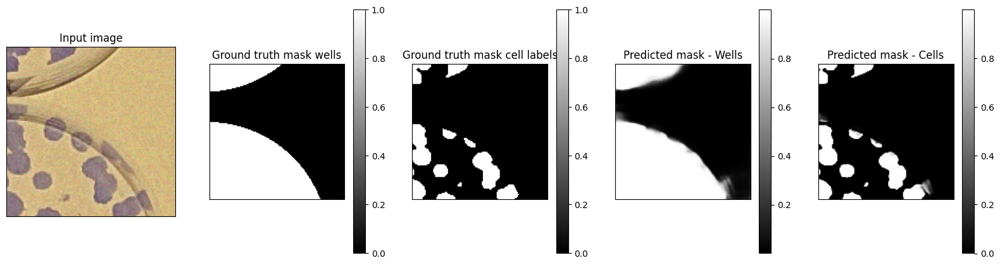

Epoch: 2100, Iteration: 0, Loss: 0.052678242325782776


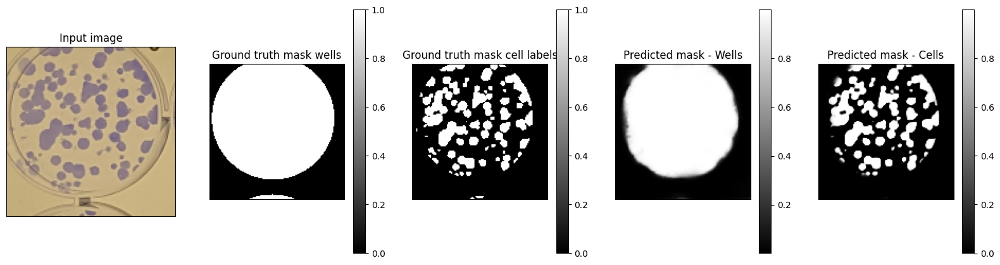

Epoch: 2200, Iteration: 0, Loss: 0.11579626798629761


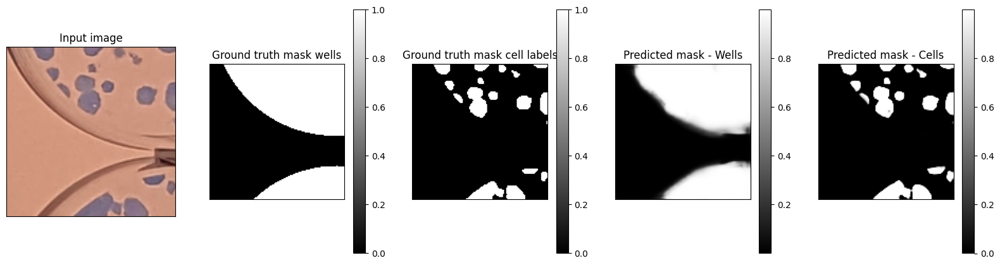

Epoch: 2300, Iteration: 0, Loss: 0.05764017999172211


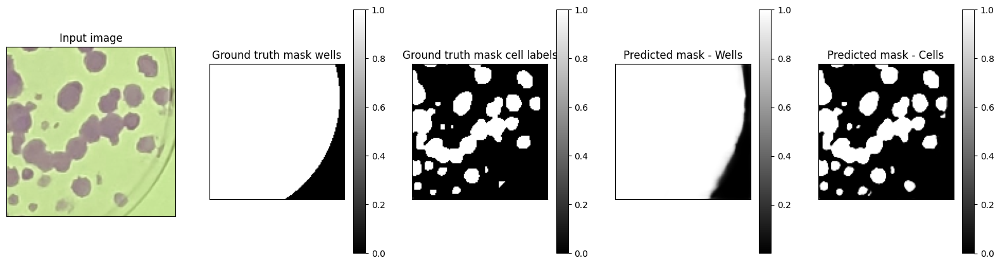

Epoch: 2400, Iteration: 0, Loss: 0.02777581289410591


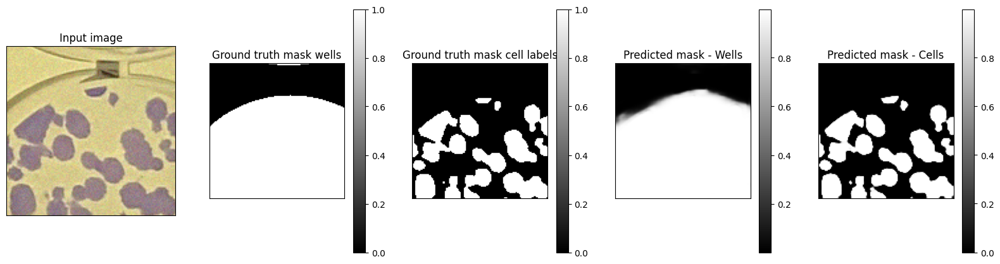

Epoch: 2500, Iteration: 0, Loss: 0.042946815490722656


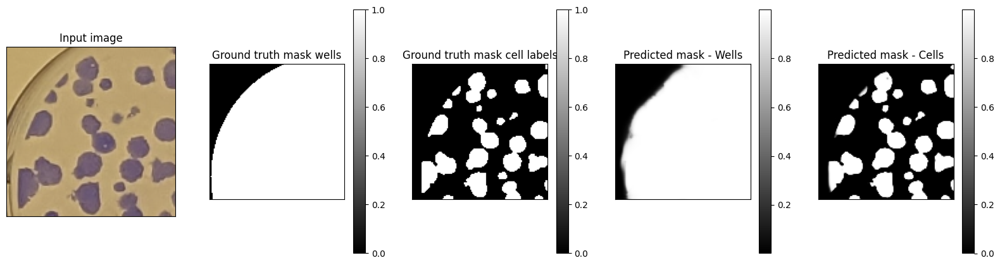

Epoch: 2600, Iteration: 0, Loss: 0.09791094064712524


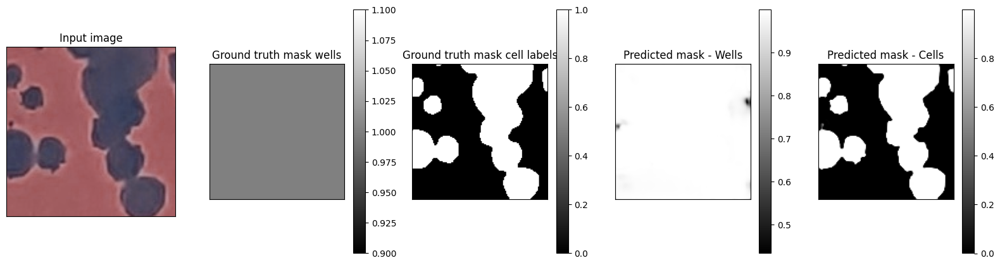

Epoch: 2700, Iteration: 0, Loss: 0.042667001485824585


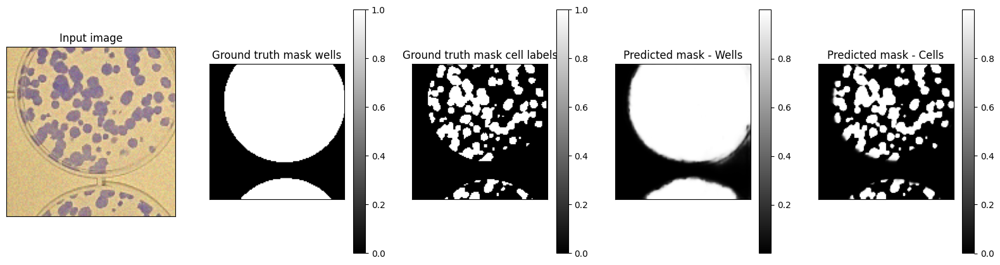

Epoch: 2800, Iteration: 0, Loss: 0.0624178871512413


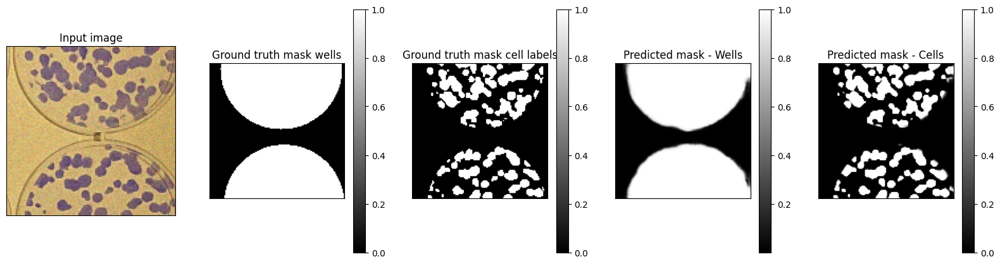

Epoch: 2900, Iteration: 0, Loss: 0.031459175050258636


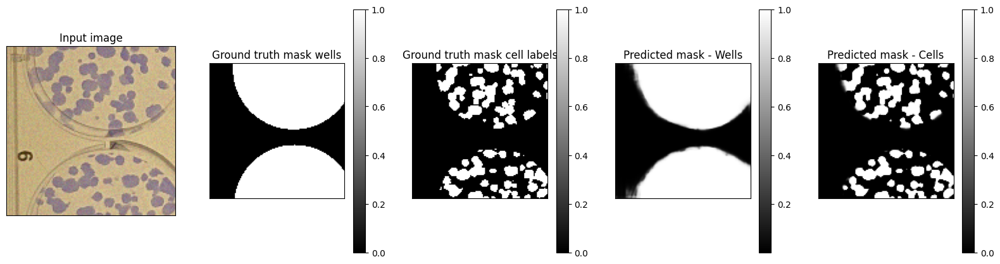

Epoch: 3000, Iteration: 0, Loss: 0.025681301951408386


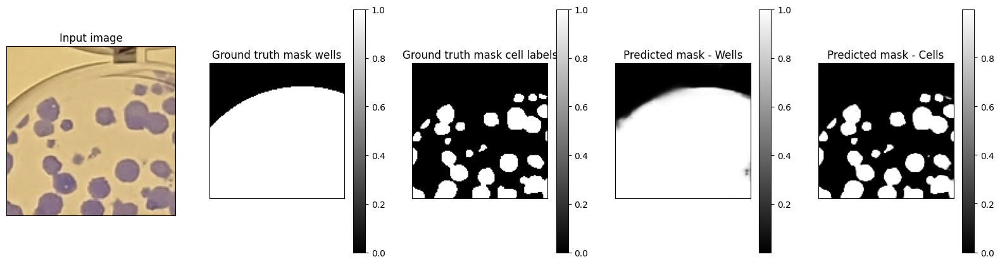

Epoch: 3100, Iteration: 0, Loss: 0.022113164886832237


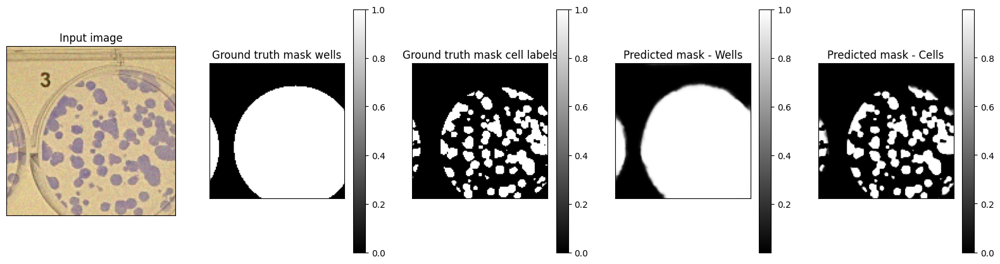

Epoch: 3300, Iteration: 0, Loss: 0.030670911073684692


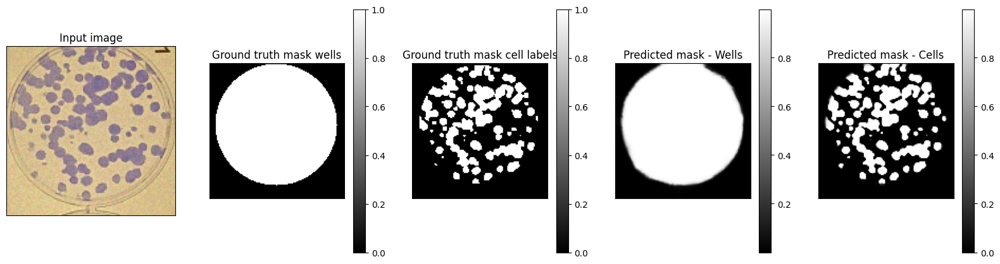

Epoch: 3400, Iteration: 0, Loss: 0.02958008646965027


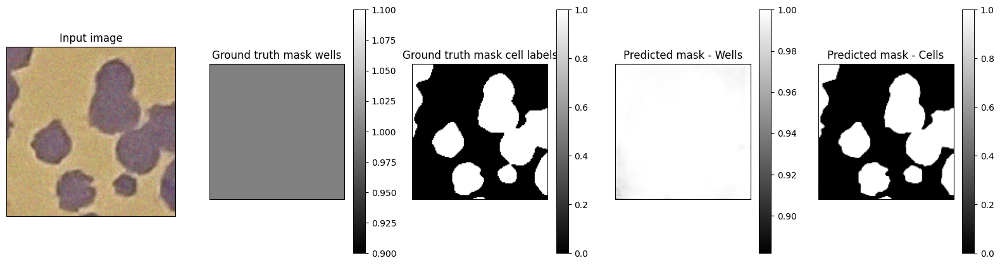

Epoch: 3500, Iteration: 0, Loss: 0.02413426712155342


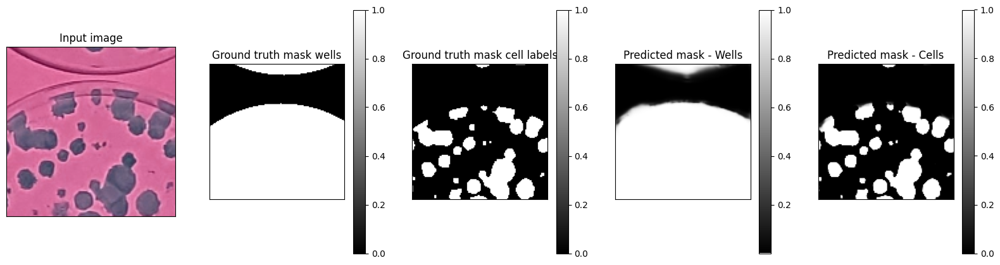

Epoch: 3600, Iteration: 0, Loss: 0.036286626011133194


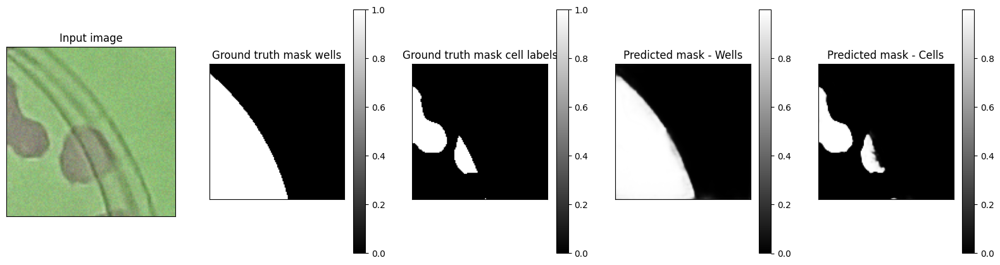

Epoch: 3700, Iteration: 0, Loss: 0.060735322535037994


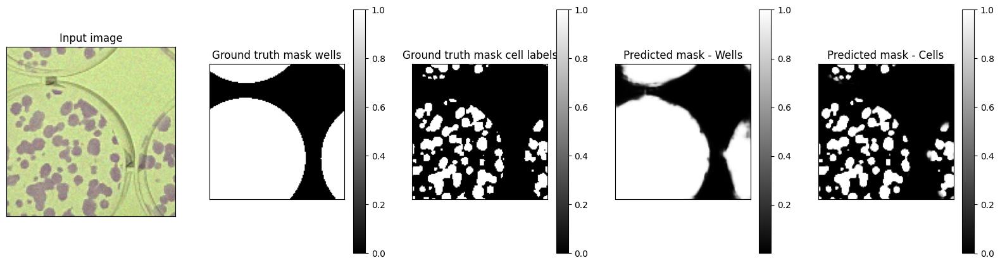

Epoch: 3800, Iteration: 0, Loss: 0.0207880400121212


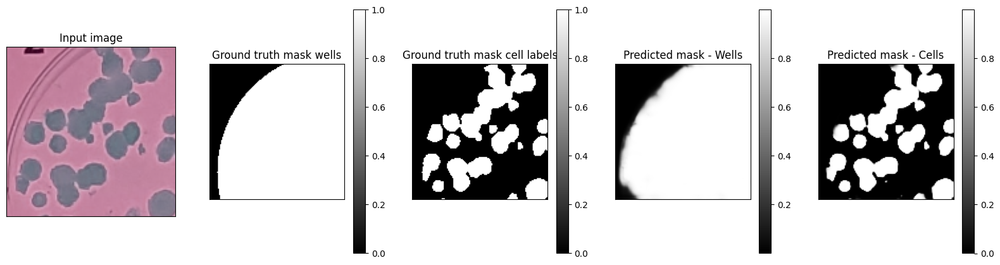

Epoch: 3900, Iteration: 0, Loss: 0.028819851577281952


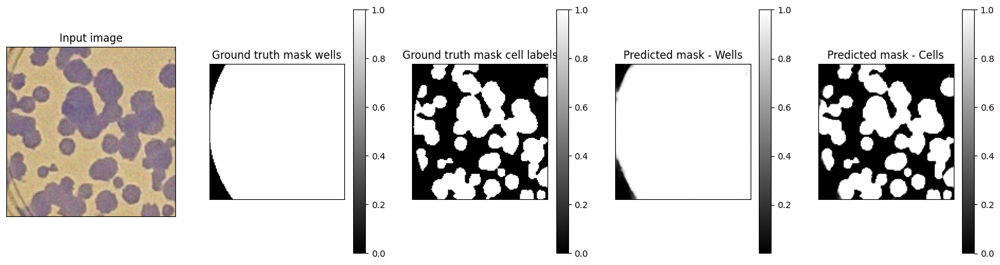

Epoch: 4000, Iteration: 0, Loss: 0.11422409117221832


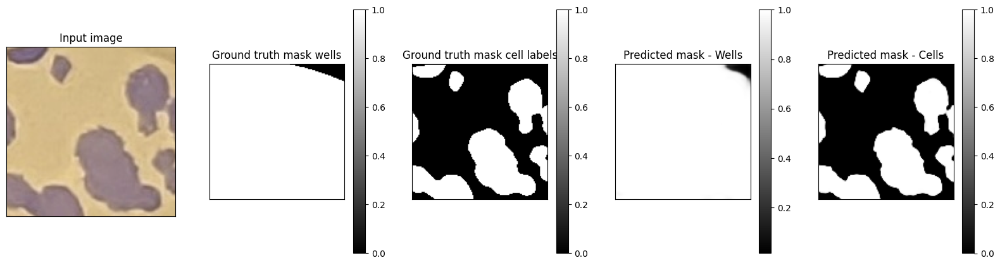

Epoch: 4100, Iteration: 0, Loss: 0.03779315575957298


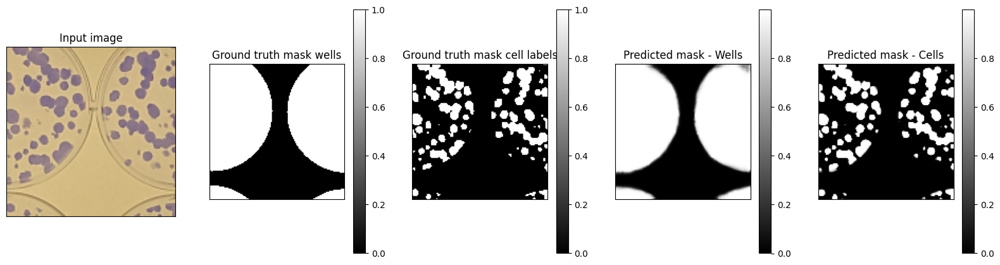

Epoch: 4200, Iteration: 0, Loss: 0.012024977244436741


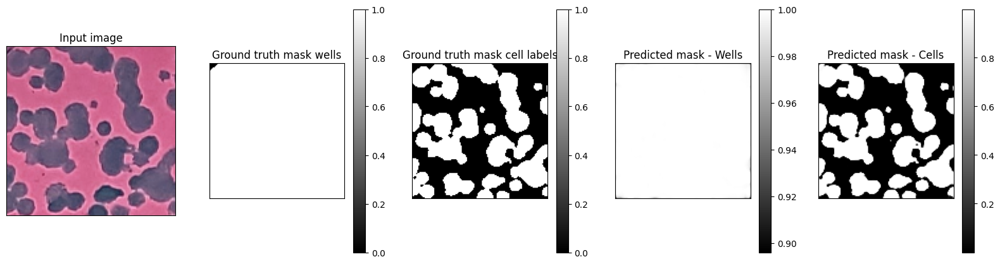

Epoch: 4300, Iteration: 0, Loss: 0.03317883238196373


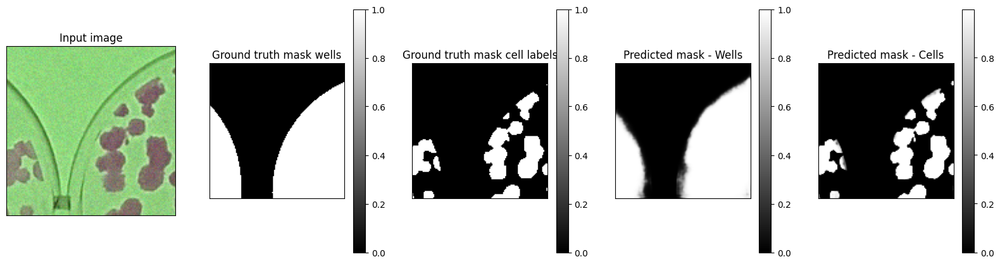

Epoch: 4400, Iteration: 0, Loss: 0.0262865349650383


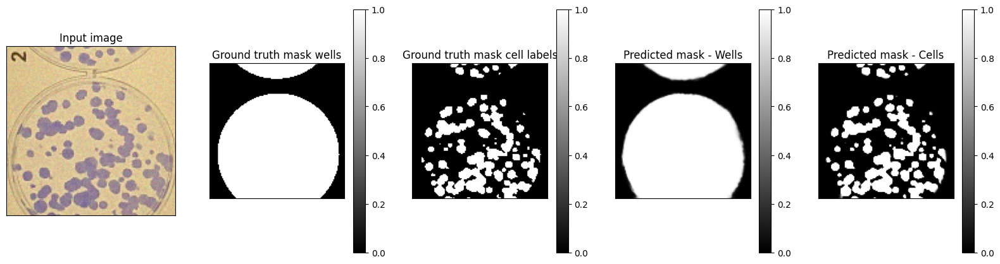

Epoch: 4500, Iteration: 0, Loss: 0.1975579708814621


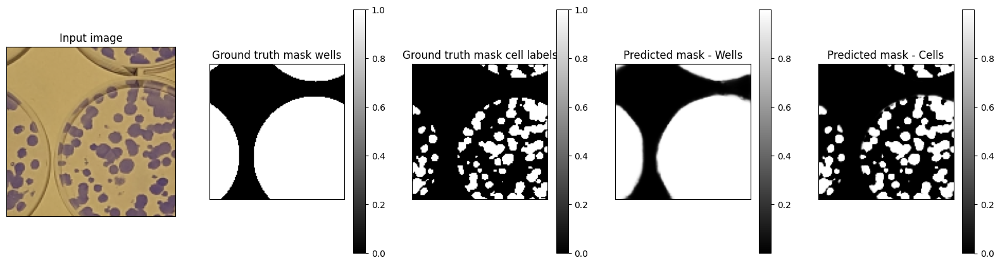

Epoch: 4600, Iteration: 0, Loss: 0.04209808260202408


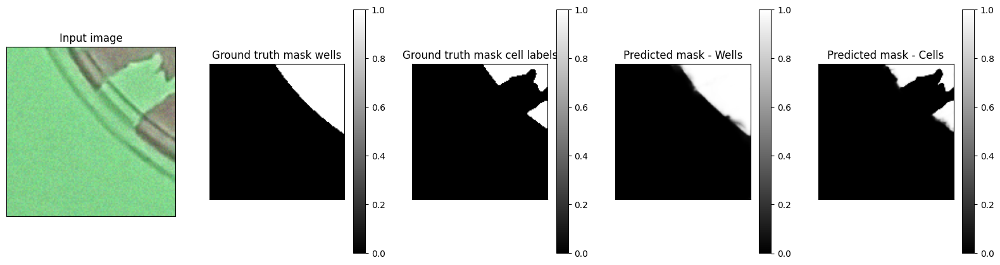

Epoch: 4700, Iteration: 0, Loss: 0.017403943464159966


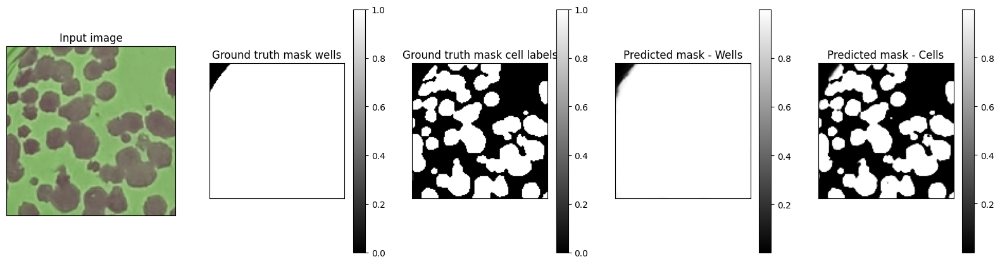

Epoch: 4800, Iteration: 0, Loss: 0.03164297342300415


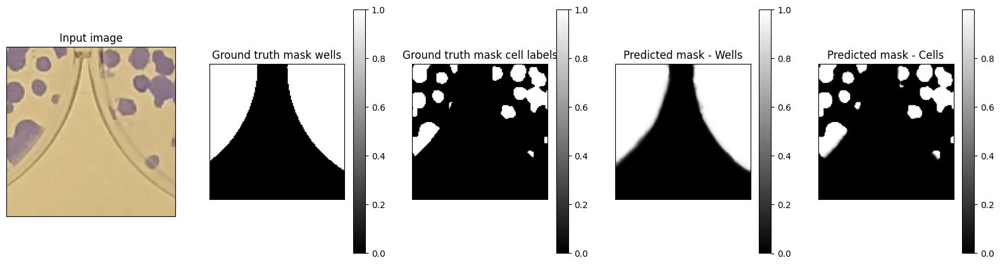

Epoch: 4900, Iteration: 0, Loss: 0.04039681702852249


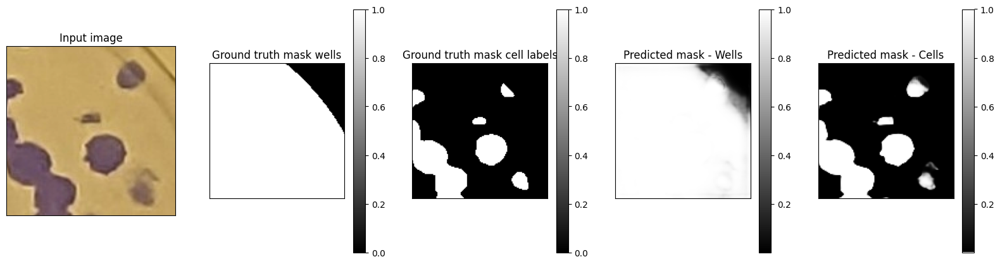

Epoch: 5000, Iteration: 0, Loss: 0.025946713984012604


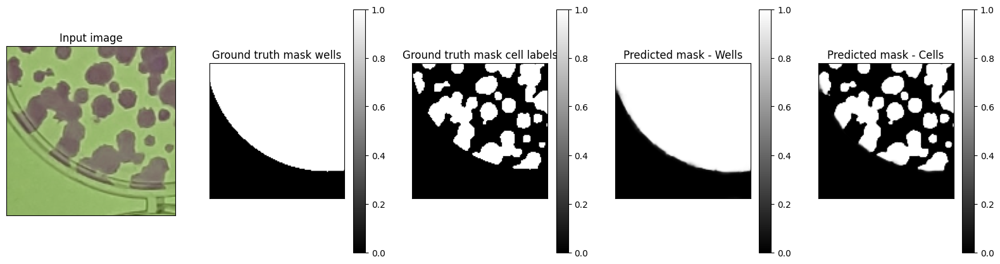

Epoch: 5100, Iteration: 0, Loss: 0.02712976187467575


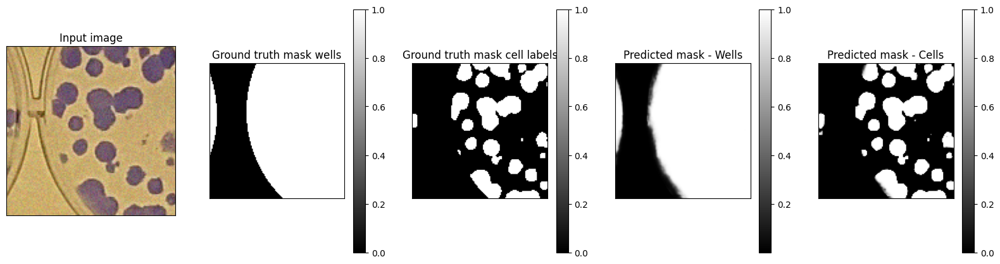

Epoch: 5200, Iteration: 0, Loss: 0.040552280843257904


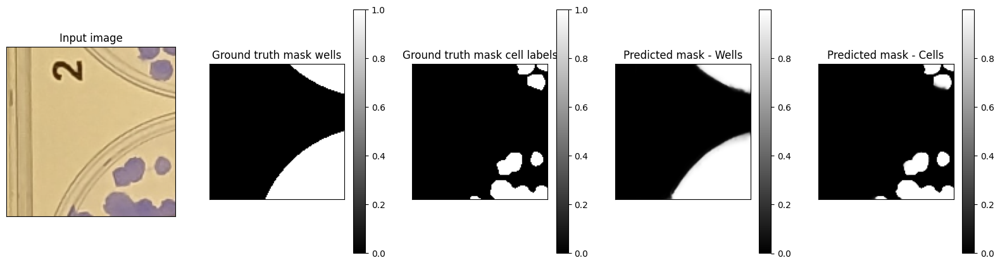

Epoch: 5300, Iteration: 0, Loss: 0.024501876905560493


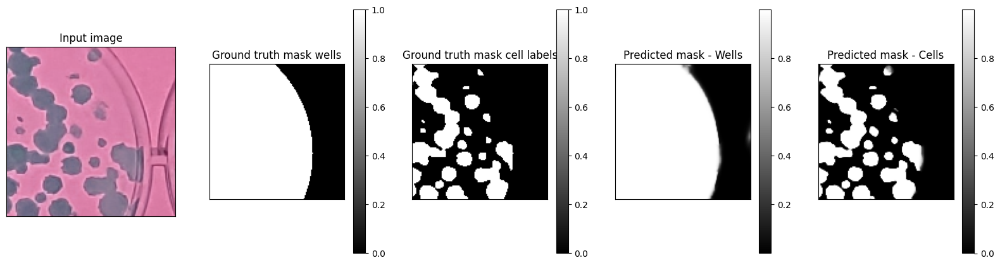

Epoch: 5400, Iteration: 0, Loss: 0.0326380655169487


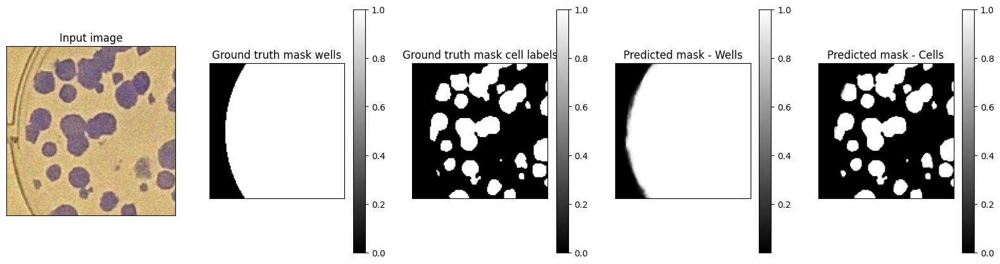

Epoch: 5500, Iteration: 0, Loss: 0.015368825756013393


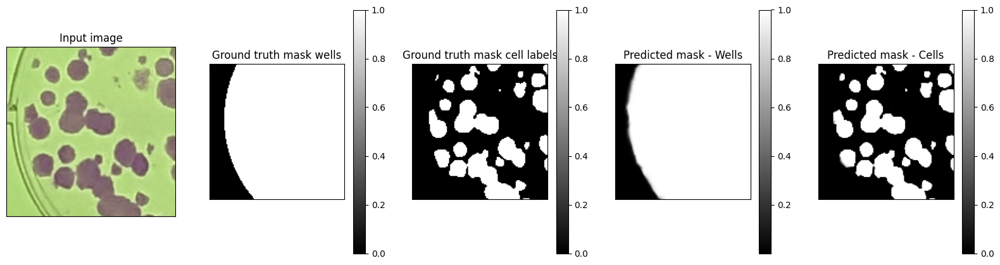

Epoch: 5700, Iteration: 0, Loss: 0.0271904356777668


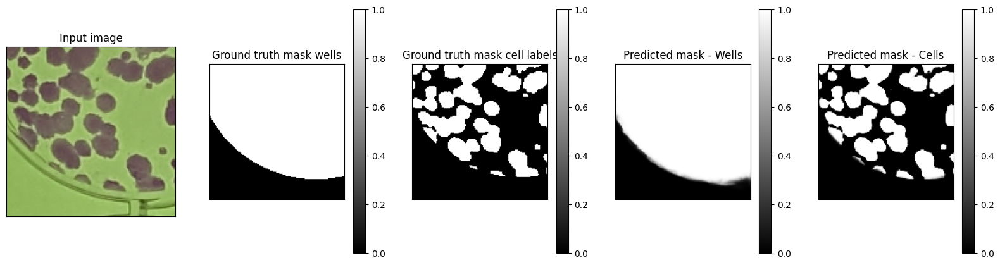

Epoch: 5800, Iteration: 0, Loss: 0.06228506565093994


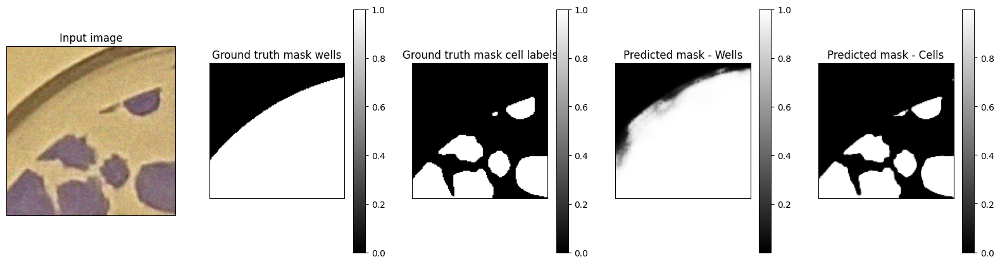

Epoch: 5900, Iteration: 0, Loss: 0.02230808138847351


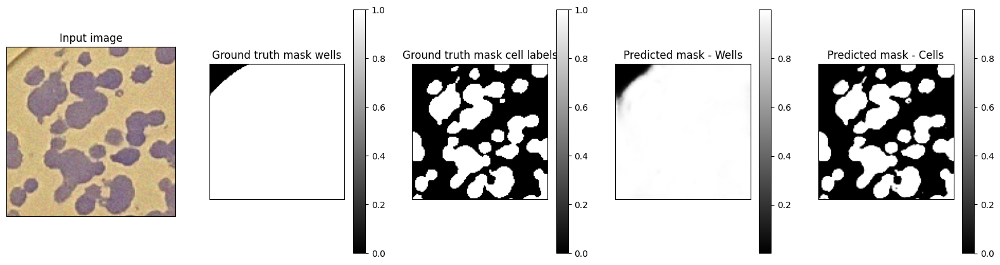

Epoch: 6000, Iteration: 0, Loss: 0.03994595631957054


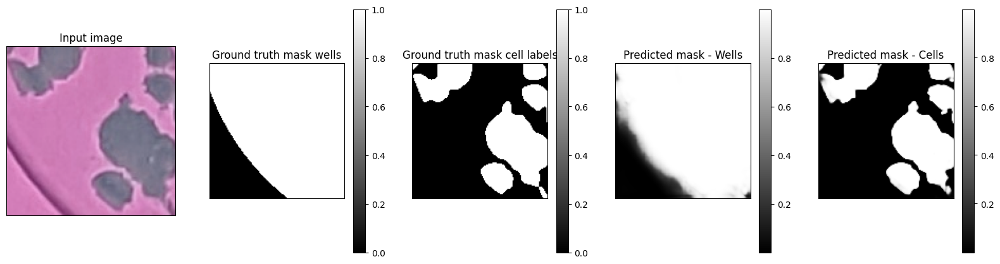

Epoch: 6100, Iteration: 0, Loss: 0.018142709508538246


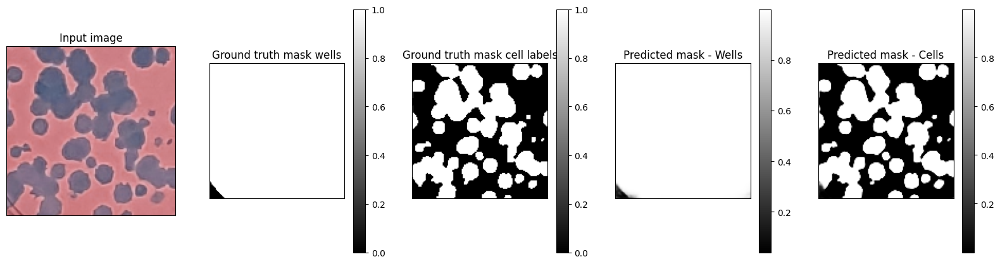

Epoch: 6200, Iteration: 0, Loss: 0.025944780558347702


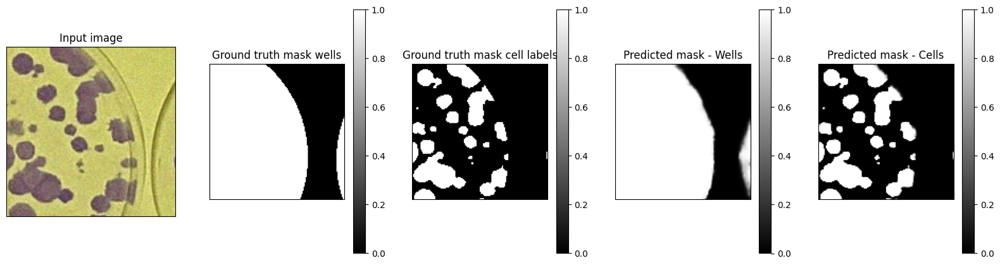

Epoch: 6300, Iteration: 0, Loss: 0.03172486275434494


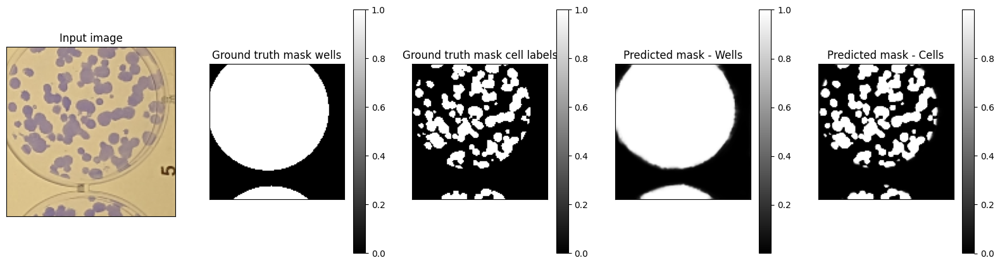

Epoch: 6400, Iteration: 0, Loss: 0.017751429229974747


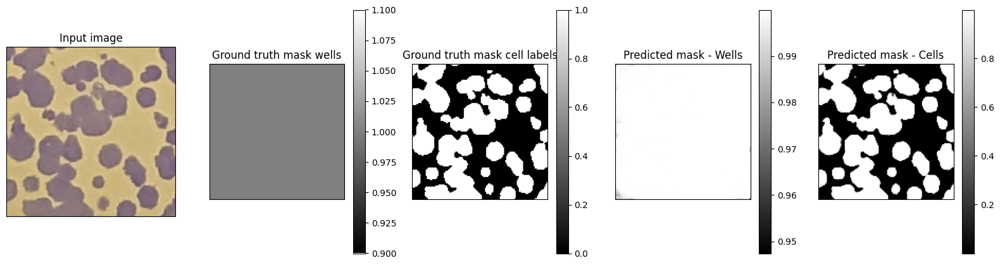

Epoch: 6500, Iteration: 0, Loss: 0.026474516838788986


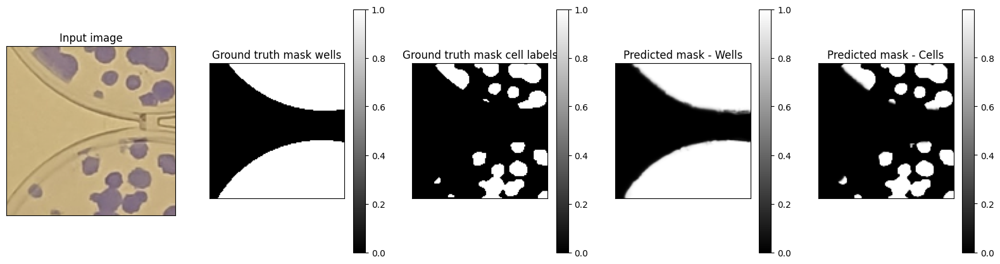

Epoch: 6600, Iteration: 0, Loss: 0.025873562321066856


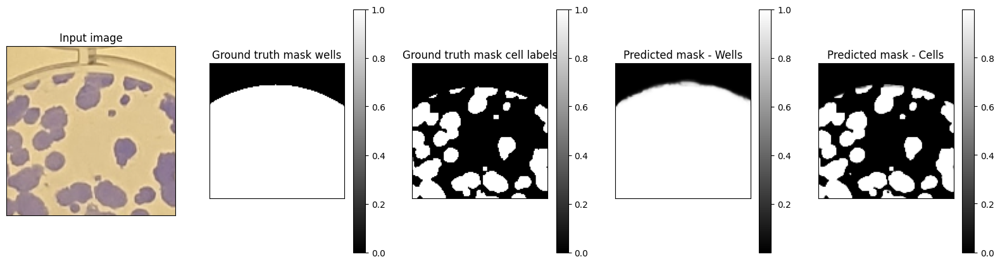

Epoch: 6700, Iteration: 0, Loss: 0.028993993997573853


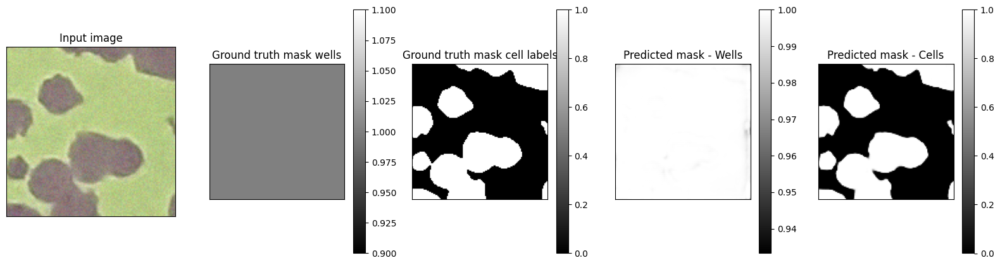

Epoch: 6800, Iteration: 0, Loss: 0.027224145829677582


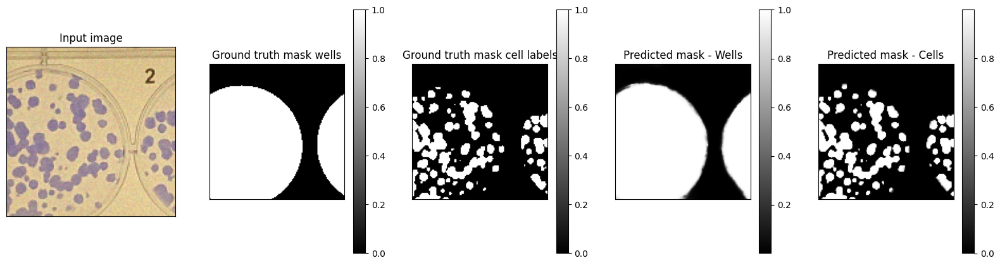

Epoch: 6900, Iteration: 0, Loss: 0.01706969179213047


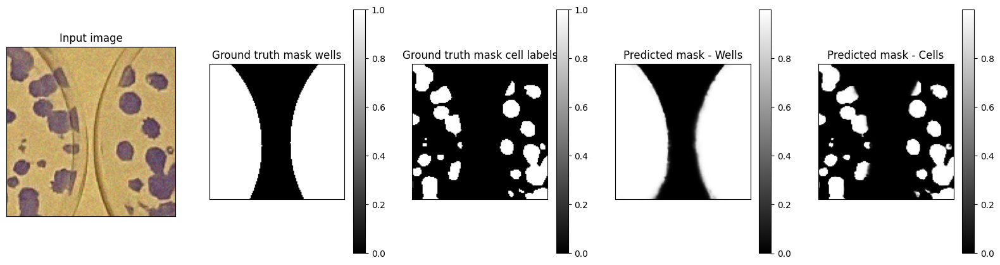

In [2]:


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


class ImageDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.files = os.listdir(root_dir + "X/")
        self.files.sort()
        self.files = [f for f in self.files if str(f).endswith(".jpg")]
    
    def __len__(self):
        return len(self.files)
    
    def __getitem__(self, idx):
        img_name = self.files[idx]
        image = plt.imread(self.root_dir + "X/" + img_name)
        label = plt.imread(self.root_dir + "Y/" + img_name.replace(".jpg", ".png"))
        cells_label = plt.imread(self.root_dir + "Z/" + img_name.replace(".jpg", ".png"))

        if len(label.shape) == 3:
            label = label[...,0]

        if len(cells_label.shape) == 3:
            cells_label = cells_label[...,0]
        sample = {'image': image, 'label': label.astype(np.float32), 'cells_label': cells_label.astype(np.float32)}

        
        
        if self.transform:
            sample = self.transform(sample)
        
        return sample
    
class RandomCrop(object):
    def __init__(self, output_size):
        self.output_size = output_size
    
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']
        h, w = image.shape[:2]
        new_h, new_w = self.output_size, self.output_size

        if w == new_w and h == new_h:
            return {'image': image, 'label': label, 'cells_label': cells_label}
        top = np.random.randint(0, h - new_h)
        left = np.random.randint(0, w - new_w)
        
        image = image[top: top + new_h, left: left + new_w]
        label = label[top: top + new_h, left: left + new_w]
        cells_label = cells_label[top: top + new_h, left: left + new_w]
        
        
        return {'image': image, 'label': label, 'cells_label': cells_label}

class RandomMeanPool(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']

        if np.random.rand() > 0.5:
            # calculate the mean in each 2x2 squares
    
            if len(image.shape) == 3:
                image = np.stack([image[:, :, i].reshape(image.shape[0] // 2, 2, image.shape[1] // 2, 2).mean(3).mean(1) for i in range(image.shape[2])], axis=2)
            else:
                image = image.reshape(image.shape[0] // 2, 2, image.shape[1] // 2, 2).mean(3).mean(1)
    
            if len(label.shape) == 3:
                label = np.stack([label[:, :, i].reshape(label.shape[0] // 2, 2, label.shape[1] // 2, 2).mean(3).mean(1) for i in range(label.shape[2])], axis=2)
            else:
                label = label.reshape(label.shape[0] // 2, 2, label.shape[1] // 2, 2).mean(3).mean(1)
            
            if len(cells_label.shape) == 3:
                cells_label = np.stack([cells_label[:, :, i].reshape(cells_label.shape[0] // 2, 2, cells_label.shape[1] // 2, 2).mean(3).mean(1) for i in range(cells_label.shape[2])], axis=2)
            else:
                cells_label = cells_label.reshape(cells_label.shape[0] // 2, 2, cells_label.shape[1] // 2, 2).mean(3).mean(1)
    
        return {'image': image, 'label': label, 'cells_label': cells_label}
    
class ToTensor(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']

        
        # don't convert label to one-hot encoding
        image = image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image.astype(np.float32)), 'label': torch.from_numpy((label > 0.5).astype(np.float32)), 'cells_label': torch.from_numpy((cells_label > 0.5).astype(np.float32))}

    
class Normalize(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']

        
        if image.max() > 1:
            image = image / 255.0
        
        if label.max() > 1:
            label = label / 255.0

        if cells_label.max() > 1:
            cells_label = cells_label / 255.0

        return {'image': image, 'label': label, 'cells_label': cells_label}
    
class ToFloat(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']

        
        image = image.astype(np.float32)
        label = label.astype(np.float32)
        cells_label = cells_label.astype(np.float32)
        
        return {'image': image, 'label': label, 'cells_label': cells_label}
    
class RandomFlip(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']

        
        if np.random.rand() > 0.5:
            image = np.fliplr(image)
            label = np.fliplr(label)
            cells_label = np.fliplr(cells_label)
            
        if np.random.rand() > 0.5:
            image = np.flipud(image)
            label = np.flipud(label)
            cells_label = np.flipud(cells_label)
            
        return {'image': image, 'label': label, 'cells_label': cells_label}
    
class RandomRotate(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']

        
        if np.random.rand() > 0.5:
            image = np.rot90(image)
            label = np.rot90(label)
            cells_label = np.rot90(cells_label)
            
        return {'image': image, 'label': label, 'cells_label': cells_label}
    
class RandomNoise(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']
        
        if np.random.rand() > 0.5:
            image = image + np.random.rand(image.shape[0], image.shape[1], image.shape[2]) * 0.1
            
        return {'image': image, 'label': label, 'cells_label': cells_label}
    
class RandomContrast(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']

        if np.random.rand() > 0.5:
            factor = 1 + 0.2 * (np.random.rand() - 0.2)  # range between 0.5 and 1.5
            image_mean = np.mean(image)
            image = image_mean + factor * (image - image_mean)
            
        return {'image': image, 'label': label, 'cells_label': cells_label}
    
class RandomBrightness(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']
        
        if np.random.rand() > 0.5:
            factor = 1 + 0.2 * (np.random.rand() - 0.2)  # range between 0.5 and 1.5
            image = image * factor
            
        return {'image': image, 'label': label, 'cells_label': cells_label}

class RandomHue(object):
    def __call__(self, sample):
        image, label, cells_label = sample['image'], sample['label'], sample['cells_label']

        if np.random.rand() > 0.6:
            # Convert RGB to HSV
            image = colors.rgb_to_hsv(image)

            # Add a random value to the hue channel and ensure it's in the correct range
            image[:, :, 0] = (image[:, :, 0] + np.random.uniform(low=-0.25, high=0.25)) % 1

            # Convert back to RGB
            image = colors.hsv_to_rgb(image)

        return {'image': image, 'label': label, 'cells_label': cells_label}


    



# create a dataset and dataloader
transform = transforms.Compose([RandomCrop(512),
                                RandomMeanPool(),
                                RandomMeanPool(),
                                RandomCrop(128),
                                ToFloat(),
                                Normalize(),
                                RandomFlip(),
                                RandomRotate(),
                                RandomHue(),
                                RandomNoise(),
                                RandomContrast(),
                                RandomBrightness(),
                                ToTensor()])
dataset = ImageDataset(root_dir="./", transform=transform)

dataloader = DataLoader(dataset, batch_size=13, shuffle=True, num_workers=4)

from torch.utils.data import random_split

# Percentage of training set
train_percent = 0.9

# Compute the lengths of the splits
num_samples = len(dataset)
num_train = int(train_percent * num_samples)
num_test = num_samples - num_train

# Generate the splits
train_dataset, test_dataset = random_split(dataset, [num_train, num_test])

# Create data loaders for the training and test datasets
train_dataloader = DataLoader(train_dataset, batch_size=10, shuffle=True, num_workers=4)
test_dataloader = DataLoader(test_dataset, batch_size=10, shuffle=False, num_workers=4)

print("#", len(dataset))
print("# train", len(train_dataset))
print("# test", len(test_dataset))


# create a unet model
import torch
import torch.nn as nn

def double_conv(in_channels, out_channels):
    return nn.Sequential(
        nn.Conv2d(in_channels, out_channels, 3, padding=1),
        nn.ReLU(inplace=True),
        nn.Conv2d(out_channels, out_channels, 3, padding=1),
        nn.ReLU(inplace=True)
    )

class UpConv(nn.Module):
    """
    A helper Module that performs 2 convolutions and 1 UpConvolution.
    A ReLU activation follows each convolution.
    """
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_channels , in_channels // 2, kernel_size=2, stride=2)
        self.conv = double_conv(in_channels, out_channels)

    def forward(self, from_down, from_up):
        from_up = self.up(from_up)
        x = torch.cat((from_up, from_down), 1)
        x = self.conv(x)
        return x
    
class DownConv(nn.Module):
    """
    A helper Module that performs 2 convolutions and 1 MaxPool.
    A ReLU activation follows each convolution.
    """
    def __init__(self, in_channels, out_channels, pooling=True):
        super().__init__()

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.pooling = pooling

        self.conv1 = double_conv(in_channels, out_channels)
        self.conv2 = double_conv(out_channels, out_channels)
        if pooling:
            self.pool = nn.MaxPool2d(kernel_size=2)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        before_pool = x
        if self.pooling:
            x = self.pool(x)
        return x, before_pool

class UNet(nn.Module):
    def __init__(self, n_channels, n_class, depth):
        super().__init__()
        
        self.down_convs = nn.ModuleList()
        self.up_convs = nn.ModuleList()

        # create layers
        for i in range(depth):
            ins = n_channels if i == 0 else outs
            outs = 64 * 2**i
            pooling = True if i < depth-1 else False

            down_conv = DownConv(ins, outs, pooling=pooling)
            self.down_convs.append(down_conv)

        for i in range(depth-1):
            ins = outs
            outs = ins // 2
            up_conv = UpConv(ins, outs)
            self.up_convs.append(up_conv)

        self.conv_last = nn.Conv2d(outs, n_class, kernel_size=1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        encoder_outs = []

        # encoder part
        for module in self.down_convs:
            x, before_pool = module(x)
            encoder_outs.append(before_pool)

        # decoder part
        for i, module in enumerate(self.up_convs):
            before_pool = encoder_outs[-(i+2)]
            x = module(before_pool, x)

        x = self.conv_last(x)
        return self.sigmoid(x)


# create a model and optimizer
model = UNet(n_class=2, n_channels=3, depth=5)
model = model.to(device)

optimizer = optim.Adam(model.parameters(), lr=0.0001)




def plot_sample(inputs, labels, cells_labels, outputs):
    inputs = inputs.detach().cpu().numpy()
    labels = labels.detach().cpu().numpy()
    cells_labels = cells_labels.detach().cpu().numpy()
    outputs = outputs.detach().cpu().numpy()

    fig, axs = plt.subplots(1, 5, figsize=(20, 5)) 
    

    axs[0].imshow(inputs[0].transpose((1, 2, 0)))
    axs[0].set_title('Input image')
    

    im1 = axs[1].imshow(labels[0], cmap='gray')
    axs[1].set_title('Ground truth mask wells')
    fig.colorbar(im1, ax=axs[1])  # Add a colorbar

    im2 = axs[2].imshow(cells_labels[0], cmap='gray')
    axs[2].set_title('Ground truth mask cell labels')
    fig.colorbar(im2, ax=axs[2])  # Add a colorbar

    im3 = axs[3].imshow(outputs[0][0], cmap='gray')
    axs[3].set_title('Predicted mask - Wells')
    fig.colorbar(im3, ax=axs[3])  # Add a colorbar

    im4 = axs[4].imshow(outputs[0][1], cmap='gray')
    axs[4].set_title('Predicted mask - Cells')
    fig.colorbar(im4, ax=axs[4])  # Add a colorbar

    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])

    plt.show()

#def combined_loss(output, target, smooth=1e-5, lambda1=0.5, lambda2=0.5):
#    # Convert target to one-hot encoding
#    target_one_hot = F.one_hot(target, num_classes=output.shape[1]).permute(0, 3, 1, 2).float()
#    
#
#
#    intersection = (output * target_one_hot).sum(dim=(0, 2, 3))
#    union = output.sum(dim=(0, 2, 3)) + target_one_hot.sum(dim=(0, 2, 3))
#
#    dice_score = (2. * intersection + smooth) / (union + smooth)
#    dice_loss = 1 - dice_score.mean()  # return 1 - dice score to get the loss
#
#    l1_loss = F.l1_loss(output, target_one_hot)
#
#    diff_loss = F.l1_loss(1 - output[0,0,0,0], output[0,0,0,1])
#
#    # Return a weighted combination of the two losses
#    return lambda1 * dice_loss + lambda2 * l1_loss + 0.2 * diff_loss
#    #return l1_loss

class MultiClassDiceLoss(nn.Module):
    def __init__(self, eps=1e-7):
        super().__init__()
        self.eps = eps

    def forward(self, output, target):
        output = output.float()
        target = target.float()

        # Compute Dice coefficient for each class separately
        dice_per_class = []

        for i in range(output.size(1)):
            output_i = output[:, i]
            target_i = target[:, i]

            intersect = (output_i * target_i).sum()
            union = output_i.sum() + target_i.sum()

            dice = (2. * intersect + self.eps) / (union + self.eps)
            
            dice_per_class.append(dice)

        # Average over all classes
        return 1. - torch.mean(torch.stack(dice_per_class))

multiclass_dice_loss  = MultiClassDiceLoss()
bce_loss = nn.BCELoss()



# create a summary writer
writer = SummaryWriter()


# train the model
for epoch in tqdm(range(7000)):
    # Training phase
    model.train()

    # initialize running losses
    losses = 0
    dice_losses = 0
    bce_losses = 0
    l1_losses = 0
    
    for i, data in enumerate(train_dataloader):
        inputs, labels, cells_labels = data['image'], data['label'], data['cells_label']

        # Move labels and inputs to the same device as model
        inputs = inputs.to(device)
        labels = labels.to(device)
        cells_labels = cells_labels.to(device)

        # combine labels and cells_labels into one tensor for multiclass dice loss
        # they are combined along the channel dimension that does not exist yet
        combined_labels = torch.cat((labels.unsqueeze(1), cells_labels.unsqueeze(1)), dim=1)

        optimizer.zero_grad()

        outputs = model(inputs)

        dice_loss = multiclass_dice_loss(outputs, combined_labels)
        l1_loss = F.l1_loss(outputs, combined_labels)
        bce = bce_loss(outputs, combined_labels)

        loss = 0.33 * l1_loss + 0.33 * bce + 0.33 * dice_loss

        loss.backward()
        optimizer.step()

        losses += loss.detach().item()
        dice_losses += dice_loss.detach().item()
        l1_losses += l1_loss.detach().item()
        bce_losses += bce.detach().item()

    # logging training losses
    writer.add_scalar("Loss/train", losses / len(train_dataloader), epoch)
    writer.add_scalar("DiceLoss/train", dice_losses / len(train_dataloader), epoch)
    writer.add_scalar("L1Loss/train", l1_losses / len(train_dataloader), epoch)
    writer.add_scalar("BCELoss/train", bce_losses / len(train_dataloader), epoch)

    # Evaluation phase
    model.eval()

    # initialize running losses for test
    test_losses = 0
    test_dice_losses = 0
    test_bce_losses = 0
    test_l1_losses = 0

    with torch.no_grad():
        for i, data in enumerate(test_dataloader):
            inputs, labels, cells_labels = data['image'], data['label'], data['cells_label']

            # Move labels and inputs to the same device as model
            inputs = inputs.to(device)
            labels = labels.to(device)
            cells_labels = cells_labels.to(device)

            # combine labels and cells_labels into one tensor for multiclass dice loss
            # they are combined along the channel dimension that does not exist yet
            combined_labels = torch.cat((labels.unsqueeze(1), cells_labels.unsqueeze(1)), dim=1)

            outputs = model(inputs)

            dice_loss = multiclass_dice_loss(outputs, combined_labels)
            l1_loss = F.l1_loss(outputs, combined_labels)
            bce = bce_loss(outputs, combined_labels)

            loss = 0.33 * l1_loss + 0.33 * bce + 0.33 * dice_loss

            test_losses += loss.item()
            test_dice_losses += dice_loss.item()
            test_l1_losses += l1_loss.item()
            test_bce_losses += bce.item()

    # logging test losses
    writer.add_scalar("Loss/test", test_losses / len(test_dataloader), epoch)
    writer.add_scalar("DiceLoss/test", test_dice_losses / len(test_dataloader), epoch)
    writer.add_scalar("L1Loss/test", test_l1_losses / len(test_dataloader), epoch)
    writer.add_scalar("BCELoss/test", test_bce_losses / len(test_dataloader), epoch)

    # logging images
    if epoch % 100 == 0:
        if inputs.shape[1] == 3:  # for RGB images
            inputs = (inputs - inputs.min()) / (inputs.max() - inputs.min())
            writer.add_image("Input images", make_grid(inputs[:1].cpu(), nrow=4), global_step=epoch)
            writer.add_image("well_mask output", make_grid(outputs[:1,0].detach().cpu(), nrow=4), global_step=epoch)
            writer.add_image("cell_mask output", make_grid(outputs[:1,1].detach().cpu(), nrow=4), global_step=epoch)
            writer.add_image("well_mask target", make_grid(combined_labels[:1,0].detach().cpu(), nrow=4), global_step=epoch)
            writer.add_image("cell_mask target", make_grid(combined_labels[:1,1].detach().cpu(), nrow=4), global_step=epoch)
        print("Epoch: {}, Iteration: {}, Loss: {}".format(epoch, i, loss.item()))
        plot_sample(inputs, labels, cells_labels, outputs)

    writer.flush()

torch.save(model, 'model.pth')

writer.close()



In [3]:
from torch.jit import trace
example_input = torch.rand(1, 3, 256, 256)

traced_model = trace(model.to(torch.device("cpu")), example_input)
traced_model.save('model.pt')